In [4]:
import numpy as np


def read_seg_centers(fichero):
  (H,V,nseg)=np.fromfile(fichero,count=3,dtype=np.uint32)
  datos=np.fromfile(fichero,count=H*V,offset=3*4,dtype=np.uint32)
  print('* Read centers:',fichero)
  print('  H:',H,'V:',V,'nseg',nseg)
  print('  Read:',len(datos))
  return(datos,H,V,nseg)

fichero = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img_centros.raw"
datos,H,V,nseg = read_seg_centers(fichero)
print("datos:",datos)
print("H:",H)
print("V:",V)
print("nseg:",nseg)

* Read centers: /home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img_centros.raw
  H: 1 V: 93334 nseg 1
  Read: 93334
datos: [   80314   182516   160646 ... 50379754 50390210 50388794]
H: 1
V: 93334
nseg: 1


In [2]:
print("datos[0]:",datos[0])
print("datos[1]:",datos[1])

#print(f"x={datos[0]%7300}, y={datos[0]//7300}")
center_coords = []
for i in datos:
    print(f"x={i%7300}, y={i//7300}")
    center_coords.append((i%7300, i//7300))

datos[0]: 21914
datos[1]: 80326
x=14, y=3
x=26, y=11
x=39, y=10
x=53, y=5
x=65, y=9
x=93, y=9
x=115, y=6
x=133, y=7
x=155, y=5
x=167, y=4
x=183, y=8
x=192, y=6
x=201, y=7
x=214, y=4
x=230, y=7
x=255, y=29
x=246, y=10
x=289, y=10
x=297, y=9
x=310, y=10
x=326, y=27
x=338, y=42
x=349, y=26
x=363, y=7
x=387, y=14
x=400, y=8
x=416, y=6
x=415, y=14
x=428, y=8
x=453, y=16
x=483, y=3
x=491, y=4
x=506, y=14
x=517, y=5
x=530, y=5
x=544, y=11
x=559, y=16
x=561, y=7
x=572, y=9
x=580, y=22
x=587, y=21
x=595, y=10
x=598, y=24
x=612, y=3
x=632, y=12
x=667, y=5
x=688, y=5
x=707, y=9
x=720, y=8
x=729, y=10
x=743, y=10
x=762, y=11
x=783, y=5
x=807, y=9
x=818, y=7
x=825, y=11
x=828, y=18
x=848, y=4
x=856, y=15
x=872, y=9
x=874, y=19
x=894, y=8
x=913, y=6
x=925, y=16
x=936, y=12
x=946, y=7
x=972, y=5
x=994, y=10
x=1014, y=7
x=1033, y=9
x=1051, y=16
x=1069, y=14
x=1093, y=4
x=1106, y=10
x=1122, y=10
x=1142, y=6
x=1149, y=12
x=1161, y=21
x=1177, y=7
x=1191, y=9
x=1194, y=8
x=1208, y=6
x=1222, y=6
x=1234, y=

In [3]:
def read_seg(fichero):
  (H,V)=np.fromfile(fichero,count=2,dtype=np.uint32)
  datos=np.fromfile(fichero,count=H*V,offset=2*4,dtype=np.uint32)
  print('* Read segmentation:',fichero)
  print('  H:',H,'V:',V)
  print('  Read:',len(datos))
  return(datos,H,V)

fichero = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img.raw"
datos,H,V = read_seg(fichero)
print("datos:",len(datos))
print("H:",H)
print("V:",V)


* Read segmentation: /home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img.raw
  H: 7300 V: 6908
  Read: 50428400
datos: 50428400
H: 7300
V: 6908


# Mi código

1-Necesito pasar el watershed por la imagen.    
2-Coger la segmentacion_centros.raw y sacar la lista de coordenadas.     
3-Leer el valor de pixel de la coordenada en el GT, si el valor es 0 saltar la creación del patch e ir a la siguiente coordenada.   
4-Por cada par de coordenadas hacer un cuadrado alrededor de ese punto de NxN, esto quiere decir coger N/2 píxeles para arriba, abajo, izquierda y derecha. Esto resulta en un patch de NxN.    
5-Guardar el patch en la carpeta que corresponda a su clase en función de lo que pone en el GT y pasar al siguiente par de coordenadas.  


In [102]:
"""
import cv2
from osgeo import gdal
from matplotlib import pyplot as plt

HEIGHT = 7300
WIDTH = 6908

def get_coords_from_seg_centers(fichero):
    datos, _, _, _ = read_seg_centers(fichero)
    center_coords = []
    for i in datos:
        center_coords.append((i%HEIGHT, i//HEIGHT))
    return center_coords

def read_image_gdal_to_numpy(image_path):
    ds = gdal.Open(image_path)
    data = ds.ReadAsArray()
    data = data.transpose(1,2,0)
    ds = None
    return data[:,:,::-1]# return format is NIRRGB


def save_image(image, filename):
    #image = image.transpose(0,1,2)
    print("image shape is ", image.shape)
    sizes = np.array([image.shape[0], image.shape[1], image.shape[2]])
    image_raw = np.concatenate([sizes, image.flatten()]).astype(np.int32)

    newFile = open(filename, "wb")
    image_raw.tofile(newFile, format="%d")
    newFile.close()
    
CLASSES_ID = [
    "unlabeled",
    "industrial area",
    "paddy field",
    "irrigated field",
    "dry cropland",
    "garden land",
    "arbor forest",
    "shrub forest",
    "park",
    "natural meadow",
    "artificial meadow",
    "river",
    "urban residential",
    "lake",
    "pond",
    "fish pond",
    "snow",
    "bareland",
    "rural residential",
    "stadium",
    "square",
    "road",
    "overpass",
    "railway station",
    "airport"
]



PATCH_SIZE = 112

path_to_img = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/imagen_prueba/GF2_PMS1__L1A0000564539-MSS1.tiff"
path_to_GT = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/imagen_prueba/GF2_PMS1__L1A0000564539-MSS1_24label.png"
path_to_img_centers = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img_centros.raw"
path_dataset = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/"

import os
if not os.path.exists(path_dataset):
    os.makedirs(path_dataset)

for i in range(1,25):
    if not os.path.exists(path_dataset + f"{CLASSES_ID[i]}"):
        os.makedirs(path_dataset + f"{CLASSES_ID[i]}")

coords = get_coords_from_seg_centers(path_to_img_centers)

GT_img = cv2.imread(path_to_GT, -1)
multi_image = read_image_gdal_to_numpy(path_to_img)







print("GT_img shape:", GT_img.shape)
print("multi_image shape:", multi_image.shape)

i=0
for coord in coords:
    gt_class = GT_img[coord[1], coord[0]]
    #print(f"coord: {coord}, class: {gt_class}, class_name: {CLASSES_ID[gt_class]}")
    if gt_class != 0:
        print("coord: ", coord, " GT_class:", gt_class, " class_name:", CLASSES_ID[gt_class])
        # check if the patch is inside the image
        if coord[0] - PATCH_SIZE//2 < 0 or coord[1] - PATCH_SIZE//2 < 0 or coord[0] + PATCH_SIZE//2 >= multi_image.shape[1] or coord[1] + PATCH_SIZE//2 >= multi_image.shape[0]:
            print("patch out of image")
        else:
            patch = multi_image[coord[1] - PATCH_SIZE//2:coord[1] + PATCH_SIZE//2, coord[0] - PATCH_SIZE//2:coord[0] + PATCH_SIZE//2]
            save_image(patch, path_dataset + f"{CLASSES_ID[gt_class]}/patch_{i}_{coord}.raw")
        # 
        
        i+=1
"""



* Read centers: /home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img_centros.raw
  H: 1 V: 7501 nseg 1
  Read: 7501
GT_img shape: (6908, 7300)
multi_image shape: (6908, 7300, 4)
coord:  (168, 56)  GT_class: 3  class_name: irrigated field
image shape is  (112, 112, 4)
coord:  (280, 55)  GT_class: 3  class_name: irrigated field
patch out of image
coord:  (391, 55)  GT_class: 3  class_name: irrigated field
patch out of image
coord:  (504, 56)  GT_class: 3  class_name: irrigated field
image shape is  (112, 112, 4)
coord:  (616, 55)  GT_class: 3  class_name: irrigated field
patch out of image
coord:  (727, 56)  GT_class: 3  class_name: irrigated field
image shape is  (112, 112, 4)
coord:  (830, 56)  GT_class: 6  class_name: arbor forest
image shape is  (112, 112, 4)
coord:  (934, 55)  GT_class: 6  class_name: arbor forest
patch out of image
coord:  (1176, 55)  GT_class: 3  class_name: irrigated field
patch out of image
coord:  (1288, 56)  GT_class: 3  class_name: irrigated field

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


img shape: (112, 112, 4)


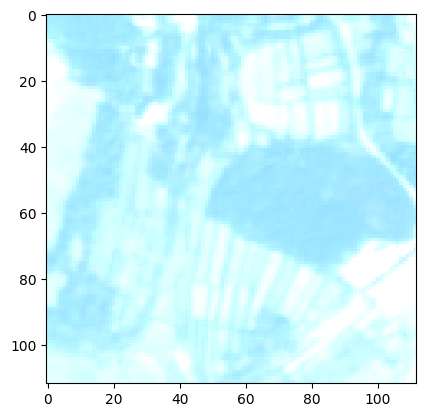

In [2]:
import matplotlib.pyplot as plt
import numpy as np
def read_rawb_image(image_path):
    with open(image_path, "rb") as f:
        sizes = np.fromfile(f, dtype=np.int32, count=3)
        image_data = np.fromfile(f, dtype=np.int32)
        image = image_data.reshape(sizes)
    return image

img_path  = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/arbor forest/patch_GF2_PMS1__L1A0000564539-MSS1_167_4648_6.raw"

img = read_rawb_image(img_path)

print("img shape:", img.shape)
#show the image with matplotlib
plt.imshow(img[:,:,[1,2,3]])

# Funcional vieja

La segmentacion al estar la regularidad a 8 genera segmentos muy cuadrados, entonces el resultado no aprovecha watershed.

Pero en general está bien.

Se compone de 3 celdas:

* La primera que aplica watershed a todas las imágenes del dataset.   
* La segunda, que a partir de las segmentaciones del watershed genera un patch de PATCH_SIZE x PATCH_SIZE, un patch por cada centro de los segmentos generados por watershed.
* La tercera muestra a que clases pertenecen los patches generados

In [107]:
import os
import subprocess

# Define paths
image_folder = "/home/pablo.canosa/Datos/split_gaofen/train_16bit"  
output_folder = "./final_16" 

os.makedirs(output_folder, exist_ok=True)

images = [img for img in os.listdir(image_folder) if img.lower().endswith(('tiff'))]

for img in images:
    input_path = os.path.join(image_folder, img)
    output_path = os.path.join(output_folder, img.split(".")[0])  # Customize output naming if needed

    command = ["./a.out", input_path, output_path, "112", "8", "112", "8"] # el primer 8 es un pcoo de taliban pero es para que no genere muchos segmentos

    try:
        subprocess.run(command, check=True)
        print(f"Processed {img}")
    except subprocess.CalledProcessError as e:
        print(f"Error processing {img}: {e}")



* Open DATASET /home/pablo.canosa/Datos/split_gaofen/train_16bit/GF2_PMS2__L1A0000736601-MSS2.tiff
  Driver: GTiff/GeoTIFF
  Size is 7300x6908x4
  Projection is 
  H=7300, V=6908, B=4
* Band 0
  Min=0.000000, Max=930.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=1  MaskFlags=1
* Band 1
  Min=0.000000, Max=915.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=0  MaskFlags=1
* Band 2
  Min=0.000000, Max=851.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=0  MaskFlags=1
* Band 3
  Min=0.000000, Max=786.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=0  MaskFlags=1
Waterpixels, region_length=112, reg=8.000000
1. Gradiente RCMG
2. WATERSHED KORBES
* Reparamos conectividad
  segments: 22689 (14902 with less than 112 pixels)
  segments: 11472 (3366 with less than 112 pixels)
  segments: 8963 (441 with less than 112 pixels)
  segments: 8579 (7 with less than 112 pixels)
  segments: 8572 (0 with less than 112 pixels)
  iteraciones: 4
  liberamos 1490

In [109]:
import cv2,os
from osgeo import gdal
from matplotlib import pyplot as plt

HEIGHT = 7300
WIDTH = 6908
PATCH_SIZE = 112

def read_seg_centers(fichero):
  (H,V,nseg)=np.fromfile(fichero,count=3,dtype=np.uint32)
  datos=np.fromfile(fichero,count=H*V,offset=3*4,dtype=np.uint32)
  #print('* Read centers:',fichero)
  #print('  H:',H,'V:',V,'nseg',nseg)
  #print('  Read:',len(datos))
  return(datos,H,V,nseg)

def get_coords_from_seg_centers(fichero):
    datos, _, _, _ = read_seg_centers(fichero)
    center_coords = []
    for i in datos:
        center_coords.append((i%HEIGHT, i//HEIGHT))
    return center_coords


def read_image_gdal_to_numpy(image_path):
    ds = gdal.Open(image_path)
    data = ds.ReadAsArray()
    data = data.transpose(1,2,0)
    ds = None
    return data[:,:,::-1]# return format is NIRRGB


def save_image(image, filename):
    #image = image.transpose(0,1,2)
    #print("image shape is ", image.shape)
    sizes = np.array([image.shape[0], image.shape[1], image.shape[2]])
    image_raw = np.concatenate([sizes, image.flatten()]).astype(np.int32)

    newFile = open(filename, "wb")
    image_raw.tofile(newFile, format="%d")
    newFile.close()

def read_rawb_image(image_path):
    with open(image_path, "rb") as f:
        sizes = np.fromfile(f, dtype=np.int32, count=3)
        image_data = np.fromfile(f, dtype=np.int32)
        image = image_data.reshape(sizes)
    return image
    
CLASSES_ID = [
    "unlabeled",
    "industrial area",
    "paddy field",
    "irrigated field",
    "dry cropland",
    "garden land",
    "arbor forest",
    "shrub forest",
    "park",
    "natural meadow",
    "artificial meadow",
    "river",
    "urban residential",
    "lake",
    "pond",
    "fish pond",
    "snow",
    "bareland",
    "rural residential",
    "stadium",
    "square",
    "road",
    "overpass",
    "railway station",
    "airport"
]





path_to_image_tiff = "/home/pablo.canosa/Datos/split_gaofen/train_16bit/"
path_to_image_GT = "/home/pablo.canosa/Datos/split_gaofen/train_grayscale_masks/"
path_to_image_centers = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/final_16/"

path_dataset = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/"

if not os.path.exists(path_dataset):
    os.makedirs(path_dataset)

for i in range(1,25):
    if not os.path.exists(path_dataset + f"{CLASSES_ID[i]}"):
        os.makedirs(path_dataset + f"{CLASSES_ID[i]}")


for idx,image_w_ext in enumerate(os.listdir(path_to_image_tiff)):
    img_name = image_w_ext.split(".")[0]
    print("img_name:", img_name," idx:", idx)

    coords = get_coords_from_seg_centers(f"{path_to_image_centers}/{img_name}_centros.raw")
    GT_img = cv2.imread(f"{path_to_image_GT}{img_name}_24label.png", -1)
    multi_image = read_image_gdal_to_numpy(path_to_image_tiff+image_w_ext)


    for coord in coords:
        gt_class = GT_img[coord[1], coord[0]]
        if gt_class != 0:
            #print("coord: ", coord, " GT_class:", gt_class, " class_name:", CLASSES_ID[gt_class])
            # check if the patch is inside the image
            if coord[0] - PATCH_SIZE//2 < 0 or coord[1] - PATCH_SIZE//2 < 0 or coord[0] + PATCH_SIZE//2 >= multi_image.shape[1] or coord[1] + PATCH_SIZE//2 >= multi_image.shape[0]:
                print("patch out of image")
            else:
                patch = multi_image[coord[1] - PATCH_SIZE//2:coord[1] + PATCH_SIZE//2, coord[0] - PATCH_SIZE//2:coord[0] + PATCH_SIZE//2]
                save_image(patch, path_dataset + f"{CLASSES_ID[gt_class]}/patch_{img_name}_{coord[0]}_{coord[1]}_{gt_class}.raw")
            # 
        

    

    


img_name: GF2_PMS2__L1A0000736601-MSS2  idx: 0
* Read centers: /home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/final_16//GF2_PMS2__L1A0000736601-MSS2_centros.raw
  H: 1 V: 8572 nseg 1
  Read: 8572
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
img_name: GF2_PMS2__L1A0000635115-MSS2  idx: 1
* Read centers: /home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/final_16//GF2_PMS2__L1A0000635115-MSS2_centros.raw
  H: 1 V: 21719 nseg 1
  Read: 21719
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
pat

In [1]:
# list classes
import os 

path_dataset = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/"

# Iterater over all the folders inside the dataset folder
# print the name of the folder and the number of files inside it
for folder in os.listdir(path_dataset):
    print(folder, len(os.listdir(path_dataset+folder)))

paddy field 18802
rural residential 164947
road 56450
snow 620
airport 1740
lake 47408
square 512
arbor forest 45319
bareland 44860
natural meadow 7604
park 653
river 21848
stadium 602
industrial area 111517
dry cropland 40931
shrub forest 26119
pond 5263
overpass 2393
artificial meadow 2801
garden land 5432
railway station 1358
fish pond 12590
urban residential 148074
irrigated field 291200


# Versión Do punto Sero

In [6]:
import cv2
from osgeo import gdal
from matplotlib import pyplot as plt

HEIGHT = 7300
WIDTH = 6908
PATCH_SIZE = 112


def get_coords_from_seg_centers(fichero):
    datos, _, _, _ = read_seg_centers(fichero)
    center_coords = []
    for i in datos:
        center_coords.append((i%HEIGHT, i//HEIGHT))
    return center_coords

def read_image_gdal_to_numpy(image_path):
    ds = gdal.Open(image_path)
    data = ds.ReadAsArray()
    data = data.transpose(1,2,0)
    ds = None
    return data[:,:,::-1]# return format is NIRRGB


def save_image(image, filename):
    #image = image.transpose(0,1,2)
    print("image shape is ", image.shape)
    sizes = np.array([image.shape[0], image.shape[1], image.shape[2]])
    image_raw = np.concatenate([sizes, image.flatten()]).astype(np.int32)

    newFile = open(filename, "wb")
    image_raw.tofile(newFile, format="%d")
    newFile.close()
    
CLASSES_ID = [
    "unlabeled",
    "industrial area",
    "paddy field",
    "irrigated field",
    "dry cropland",
    "garden land",
    "arbor forest",
    "shrub forest",
    "park",
    "natural meadow",
    "artificial meadow",
    "river",
    "urban residential",
    "lake",
    "pond",
    "fish pond",
    "snow",
    "bareland",
    "rural residential",
    "stadium",
    "square",
    "road",
    "overpass",
    "railway station",
    "airport"
]




path_to_img = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/imagen_prueba/GF2_PMS1__L1A0000564539-MSS1.tiff"
path_to_GT = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/imagen_prueba/GF2_PMS1__L1A0000564539-MSS1_24label.png"
path_to_img_centers = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img_centros.raw"
path_dataset = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/temp_dataset/"

import os
if not os.path.exists(path_dataset):
    os.makedirs(path_dataset)

for i in range(1,25):
    if not os.path.exists(path_dataset + f"{CLASSES_ID[i]}"):
        os.makedirs(path_dataset + f"{CLASSES_ID[i]}")

coords = get_coords_from_seg_centers(path_to_img_centers)

GT_img = cv2.imread(path_to_GT, -1)
multi_image = read_image_gdal_to_numpy(path_to_img)







print("GT_img shape:", GT_img.shape)
print("multi_image shape:", multi_image.shape)

saved_coords_per_class = {}# dict with the key as the class and the value is an array of pairs of coordinates
for i in range(1,25):
    saved_coords_per_class[i] = []


i=0
for coord in coords:
    gt_class = GT_img[coord[1], coord[0]]
    #print(f"coord: {coord}, class: {gt_class}, class_name: {CLASSES_ID[gt_class]}")
    if gt_class != 0:
        print("coord: ", coord, " GT_class:", gt_class, " class_name:", CLASSES_ID[gt_class])
        # check if the patch is inside the image
        if coord[0] - PATCH_SIZE//2 < 0 or coord[1] - PATCH_SIZE//2 < 0 or coord[0] + PATCH_SIZE//2 >= multi_image.shape[1] or coord[1] + PATCH_SIZE//2 >= multi_image.shape[0]:
            print("patch out of image")
        else:
            #check the distance to other patches of the same class
            valid = True
            for saved_coord in saved_coords_per_class[gt_class]:
                if np.linalg.norm(np.array(saved_coord) - np.array(coord)) < PATCH_SIZE//2:
                    valid = False
                    break
            if valid:
                patch = multi_image[coord[1] - PATCH_SIZE//2:coord[1] + PATCH_SIZE//2, coord[0] - PATCH_SIZE//2:coord[0] + PATCH_SIZE//2]
                save_image(patch, path_dataset + f"{CLASSES_ID[gt_class]}/patch_{i}_{coord}.raw")
                saved_coords_per_class[gt_class].append(coord)
        # 
        
        i+=1

* Read centers: /home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/output/img_centros.raw
  H: 1 V: 93334 nseg 1
  Read: 93334
GT_img shape: (6908, 7300)
multi_image shape: (6908, 7300, 4)
coord:  (6055, 59)  GT_class: 23  class_name: railway station
image shape is  (112, 112, 4)
coord:  (6065, 73)  GT_class: 23  class_name: railway station
coord:  (6079, 67)  GT_class: 23  class_name: railway station
coord:  (6534, 56)  GT_class: 3  class_name: irrigated field
image shape is  (112, 112, 4)
coord:  (5256, 62)  GT_class: 14  class_name: pond
image shape is  (112, 112, 4)
coord:  (6004, 58)  GT_class: 23  class_name: railway station
coord:  (330, 61)  GT_class: 22  class_name: overpass
image shape is  (112, 112, 4)
coord:  (4438, 55)  GT_class: 3  class_name: irrigated field
patch out of image
coord:  (5595, 54)  GT_class: 3  class_name: irrigated field
patch out of image
coord:  (5968, 58)  GT_class: 23  class_name: railway station
image shape is  (112, 112, 4)
coord:  (63, 59)  GT_c

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


img shape: (112, 112, 4)


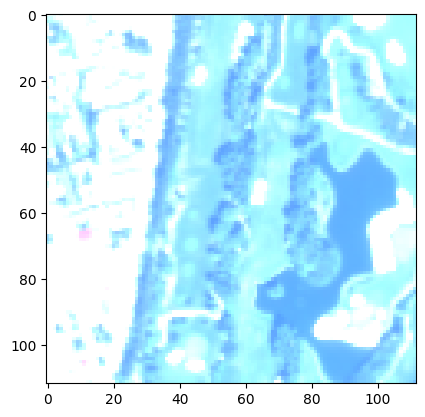

In [4]:
import matplotlib.pyplot as plt
import numpy as np
def read_rawb_image(image_path):
    with open(image_path, "rb") as f:
        sizes = np.fromfile(f, dtype=np.int32, count=3)
        image_data = np.fromfile(f, dtype=np.int32)
        image = image_data.reshape(sizes)
    return image

img_path  = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/artificial meadow/patch_GF2_PMS1__L1A0001037899-MSS1_4149_6686_10.raw"

img = read_rawb_image(img_path)


print("img shape:", img.shape)
#show the image with matplotlib
plt.imshow(img[:,:,[1,2,3]])

# PRUEBA NUEVA

In [9]:
import os
import subprocess

# Define paths
image_folder = "/home/pablo.canosa/Datos/split_gaofen/train_16bit"  
output_folder = "./final_16" 

os.makedirs(output_folder, exist_ok=True)

images = [img for img in os.listdir(image_folder) if img.lower().endswith(('tiff'))]

for img in images:
    input_path = os.path.join(image_folder, img)
    output_path = os.path.join(output_folder, img.split(".")[0])  # Customize output naming if needed

    command = ["./a.out", input_path, output_path, "256", "0.5", "256", "8"] # el primer 8 es un pcoo de taliban pero es para que no genere muchos segmentos

    try:
        subprocess.run(command, check=True)
        print(f"Processed {img}")
    except subprocess.CalledProcessError as e:
        print(f"Error processing {img}: {e}")


* Open DATASET /home/pablo.canosa/Datos/split_gaofen/train_16bit/GF2_PMS2__L1A0000736601-MSS2.tiff
  Driver: GTiff/GeoTIFF
  Size is 7300x6908x4
  Projection is 
  H=7300, V=6908, B=4
* Band 0
  Min=0.000000, Max=930.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=1  MaskFlags=1
* Band 1
  Min=0.000000, Max=915.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=0  MaskFlags=1
* Band 2
  Min=0.000000, Max=851.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=0  MaskFlags=1
* Band 3
  Min=0.000000, Max=786.000000, NODATA: -10000000000.000000
  Datatype=2  ColorInt=0  MaskFlags=1
Waterpixels, region_length=256, reg=0.500000
1. Gradiente RCMG
2. WATERSHED KORBES
* Reparamos conectividad
  segments: 2544212 (2542606 with less than 256 pixels)
  segments: 870772 (867509 with less than 256 pixels)
  segments: 287712 (243228 with less than 256 pixels)
  segments: 110612 (19371 with less than 256 pixels)
  segments: 92303 (27 with less than 256 pixels)
  segments: 9

In [13]:
import cv2,os
from osgeo import gdal
from matplotlib import pyplot as plt

HEIGHT = 7300
WIDTH = 6908
PATCH_SIZE = 112

def read_seg_centers(fichero):
  (H,V,nseg)=np.fromfile(fichero,count=3,dtype=np.uint32)
  datos=np.fromfile(fichero,count=H*V,offset=3*4,dtype=np.uint32)
  #print('* Read centers:',fichero)
  #print('  H:',H,'V:',V,'nseg',nseg)
  #print('  Read:',len(datos))
  return(datos,H,V,nseg)

def get_coords_from_seg_centers(fichero):
    datos, _, _, _ = read_seg_centers(fichero)
    center_coords = []
    for i in datos:
        center_coords.append((i%HEIGHT, i//HEIGHT))
    return center_coords


def read_image_gdal_to_numpy(image_path):
    ds = gdal.Open(image_path)
    data = ds.ReadAsArray()
    data = data.transpose(1,2,0)
    ds = None
    return data[:,:,::-1]# return format is NIRRGB


def save_image(image, filename):
    #image = image.transpose(0,1,2)
    #print("image shape is ", image.shape)
    sizes = np.array([image.shape[0], image.shape[1], image.shape[2]])
    image_raw = np.concatenate([sizes, image.flatten()]).astype(np.int32)

    newFile = open(filename, "wb")
    image_raw.tofile(newFile, format="%d")
    newFile.close()

def read_rawb_image(image_path):
    with open(image_path, "rb") as f:
        sizes = np.fromfile(f, dtype=np.int32, count=3)
        image_data = np.fromfile(f, dtype=np.int32)
        image = image_data.reshape(sizes)
    return image
    
CLASSES_ID = [
    "unlabeled",
    "industrial area",
    "paddy field",
    "irrigated field",
    "dry cropland",
    "garden land",
    "arbor forest",
    "shrub forest",
    "park",
    "natural meadow",
    "artificial meadow",
    "river",
    "urban residential",
    "lake",
    "pond",
    "fish pond",
    "snow",
    "bareland",
    "rural residential",
    "stadium",
    "square",
    "road",
    "overpass",
    "railway station",
    "airport"
]





path_to_image_tiff = "/home/pablo.canosa/Datos/split_gaofen/train_16bit/"
path_to_image_GT = "/home/pablo.canosa/Datos/split_gaofen/train_grayscale_masks/"
path_to_image_centers = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/final_16/"

path_dataset = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/"

if not os.path.exists(path_dataset):
    os.makedirs(path_dataset)

for i in range(1,25):
    if not os.path.exists(path_dataset + f"{CLASSES_ID[i]}"):
        os.makedirs(path_dataset + f"{CLASSES_ID[i]}")


for idx,image_w_ext in enumerate(os.listdir(path_to_image_tiff)):
    img_name = image_w_ext.split(".")[0]
    print("img_name:", img_name," idx:", idx)

    coords = get_coords_from_seg_centers(f"{path_to_image_centers}/{img_name}_centros.raw")
    GT_img = cv2.imread(f"{path_to_image_GT}{img_name}_24label.png", -1)
    multi_image = read_image_gdal_to_numpy(path_to_image_tiff+image_w_ext)


    i=0
    for coord in coords:
        gt_class = GT_img[coord[1], coord[0]]
        #print(f"coord: {coord}, class: {gt_class}, class_name: {CLASSES_ID[gt_class]}")
        if gt_class != 0:
            #print("coord: ", coord, " GT_class:", gt_class, " class_name:", CLASSES_ID[gt_class])
            # check if the patch is inside the image
            if coord[0] - PATCH_SIZE//2 < 0 or coord[1] - PATCH_SIZE//2 < 0 or coord[0] + PATCH_SIZE//2 >= multi_image.shape[1] or coord[1] + PATCH_SIZE//2 >= multi_image.shape[0]:
                print("patch out of image")
            else:
                #check the distance to other patches of the same class
                valid = True
                for saved_coord in saved_coords_per_class[gt_class]:
                    if np.linalg.norm(np.array(saved_coord) - np.array(coord)) < PATCH_SIZE//2:
                        valid = False
                        break
                if valid:
                    patch = multi_image[coord[1] - PATCH_SIZE//2:coord[1] + PATCH_SIZE//2, coord[0] - PATCH_SIZE//2:coord[0] + PATCH_SIZE//2]
                    save_image(patch, path_dataset + f"{CLASSES_ID[gt_class]}/patch_{img_name}_{coord[0]}_{coord[1]}_{gt_class}.raw")
                    saved_coords_per_class[gt_class].append(coord)
                    print("patch saved ",i)
                    i+=1
    print("############################################################################")
    print("############################################################################")
    print("############################################################################")
    print("############################################################################")
    print("Image name: ", img_name)
    print("Number of source patches: ", len(coords))
    print("Total patches saved: ", i)
    print("############################################################################")
    print("############################################################################")
    print("############################################################################")
    print("############################################################################")

    
        

    

    


img_name: GF2_PMS2__L1A0000736601-MSS2  idx: 0
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
patch out of image
pat

# DATASET TESTING

In [6]:
# Pruebas de imagenes mientras espero a que acabe de crearse el dataset

import matplotlib.pyplot as plt
import numpy as np
import os
from osgeo import gdal
import cv2


import re

CLASSES_ID = [
    "unlabeled",
    "industrial area",
    "paddy field",
    "irrigated field",
    "dry cropland",
    "garden land",
    "arbor forest",
    "shrub forest",
    "park",
    "natural meadow",
    "artificial meadow",
    "river",
    "urban residential",
    "lake",
    "pond",
    "fish pond",
    "snow",
    "bareland",
    "rural residential",
    "stadium",
    "square",
    "road",
    "overpass",
    "railway station",
    "airport"
]


def extract_info(input_string):
    # Updated regex to handle variable-length number groups
    match = re.search(r'patch_(GF2_[^_]+__[^_]+-MSS\d+)_?(\d{1,4})_(\d{1,4})_(\d{1,2})\.raw$', input_string)

    if match:
        # Get the desired string without 'patch_' prefix
        desired_string = match.group(1)
        
        # The last two groups of numbers
        last_two_numbers = f"{match.group(2)},{match.group(3)}"
        last_number = match.group(4)
        
        # Print the class and number using the last number
        print("###########################################")
        print(f"Class: {CLASSES_ID[int(last_number)]}, number: {last_number}")
        print("###########################################")
    else:
        desired_string = ''
        last_two_numbers = ''
    
    return desired_string, last_two_numbers


def read_rawb_image(image_path):
    with open(image_path, "rb") as f:
        sizes = np.fromfile(f, dtype=np.int32, count=3)
        image_data = np.fromfile(f, dtype=np.int32)
        image = image_data.reshape(sizes)
    return image

def read_image_gdal_to_numpy(image_path):
    ds = gdal.Open(image_path)
    data = ds.ReadAsArray()
    data = data.transpose(1,2,0)
    ds = None
    return data[:,:,::-1]# return format is NIRRGB


img_path  = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/"
# save the folders contained in the path as a list
folders = os.listdir(img_path)
# pick one of the folders randomly
folder = np.random.choice(folders)
img_path = os.path.join(img_path, folder)

# pick a random image from the folder
img_name = np.random.choice(os.listdir(img_path))
print((img_path + "/" + img_name))
string, numbers = extract_info(img_path + "/" + img_name)


original_img_folder = "/home/pablo.canosa/Datos/split_gaofen/train_16bit/"
# read image using GDAL
print(f"{original_img_folder.strip()}{string.strip()}.tiff")
img_full = read_image_gdal_to_numpy(f"{original_img_folder.strip()}{string.strip()}.tiff")
img_full = (img_full - img_full.min()) / (img_full.max() - img_full.min())
img_full = (img_full * 255).astype(np.uint8)

img_full = img_full[:,:,[0,1,2]]

# Cast numbers to int
numbers = numbers.split(',')
numbers = [int(i) for i in numbers]



half_box = 56
border_width = 4

img_full[numbers[1] - half_box:numbers[1] + half_box, numbers[0] - half_box:numbers[0] - half_box + border_width] = 255
img_full[numbers[1] - half_box:numbers[1] + half_box, numbers[0] + half_box - border_width:numbers[0] + half_box] = 255
img_full[numbers[1] - half_box:numbers[1] - half_box + border_width, numbers[0] - half_box:numbers[0] + half_box] = 255
img_full[numbers[1] + half_box - border_width:numbers[1] + half_box, numbers[0] - half_box:numbers[0] + half_box] = 255


# show the image with opencv
cv2.namedWindow("img", cv2.WINDOW_NORMAL)
cv2.imshow("img", img_full[:,:,::-1])



img = read_rawb_image(img_path + "/" + img_name)
print("img_name:", img_name)
img = (img - img.min()) / (img.max() - img.min())
img = (img * 255).astype(np.uint8)




#cv2.namedWindow("img_mini", cv2.WINDOW_NORMAL)
img= img[:,:,[0,1,2]]
cv2.imshow("img_mini", img[:,:,::-1])
cv2.waitKey(0)
cv2.destroyAllWindows()

/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/arbor forest/patch_GF2_PMS1__L1A0001660727-MSS1_4788_4856_6.raw
###########################################
Class: arbor forest, number: 6
###########################################
/home/pablo.canosa/Datos/split_gaofen/train_16bit/GF2_PMS1__L1A0001660727-MSS1.tiff
img_name: patch_GF2_PMS1__L1A0001660727-MSS1_4788_4856_6.raw


In [7]:
dataset = "/home/pablo.canosa/gaofen_clasificacion/pruebas_pablo/dataset/"

# for each of the folders in the dataset print the number of images along with the name of each folder

for folder in os.listdir(dataset):
    print(f"{folder} has {len(os.listdir(dataset + folder))} images")

paddy field has 9505 images
rural residential has 9105 images
road has 8576 images
snow has 567 images
airport has 830 images
lake has 10135 images
square has 340 images
arbor forest has 10298 images
bareland has 10444 images
natural meadow has 9114 images
park has 509 images
river has 8412 images
stadium has 220 images
industrial area has 9744 images
dry cropland has 9858 images
shrub forest has 10643 images
pond has 6177 images
overpass has 2352 images
artificial meadow has 3193 images
garden land has 7178 images
railway station has 946 images
fish pond has 6606 images
urban residential has 10245 images
irrigated field has 2899 images
